In [2]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [3]:
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

--2024-09-20 12:22:49--  https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg
Resolving segment-anything.com (segment-anything.com)... 18.64.236.6, 18.64.236.19, 18.64.236.71, ...
Connecting to segment-anything.com (segment-anything.com)|18.64.236.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 221810 (217K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>] 216.61K  --.-KB/s    in 0.04s   

2024-09-20 12:22:49 (5.73 MB/s) - ‘dog.jpg’ saved [221810/221810]



In [4]:
# Read in a image from torchvision
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


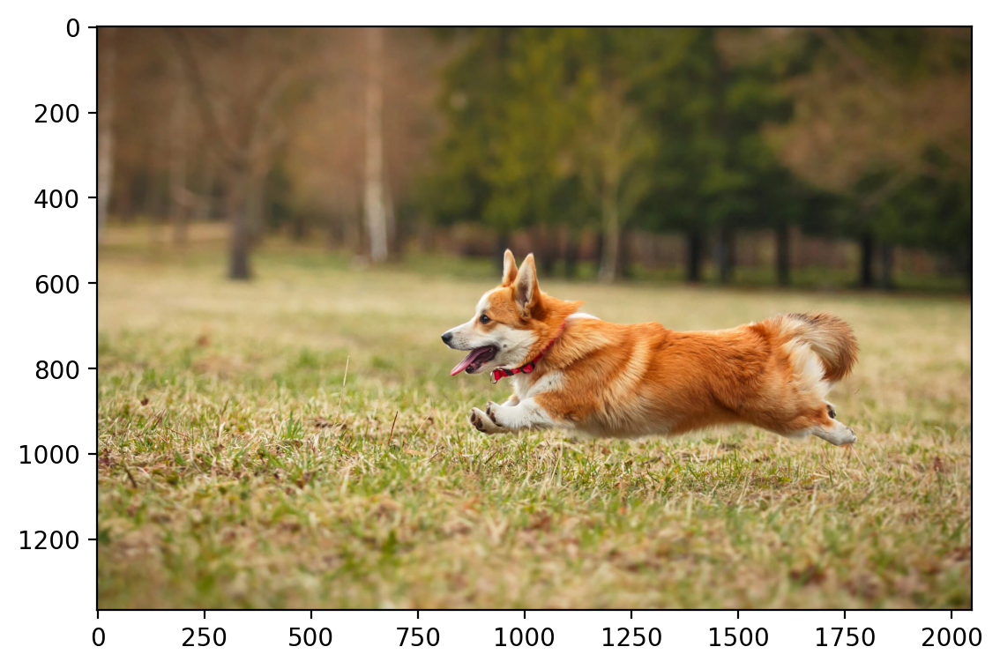

In [5]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [6]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [7]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)

In [8]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [9]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop.shape

torch.Size([3, 300, 300])

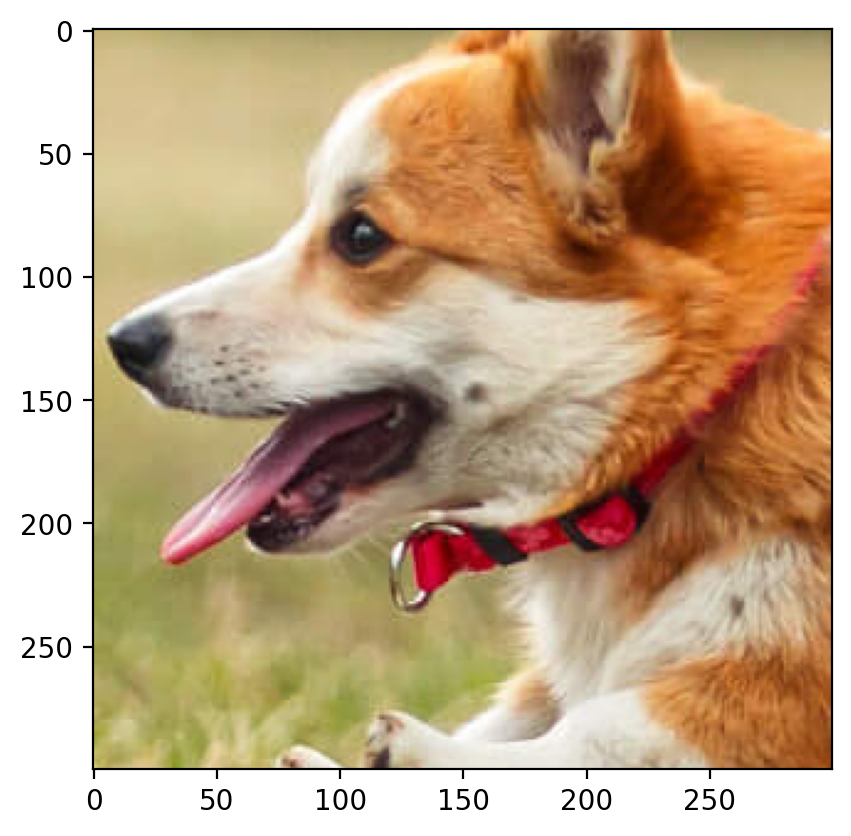

In [10]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [11]:
crop = crop.to(device)

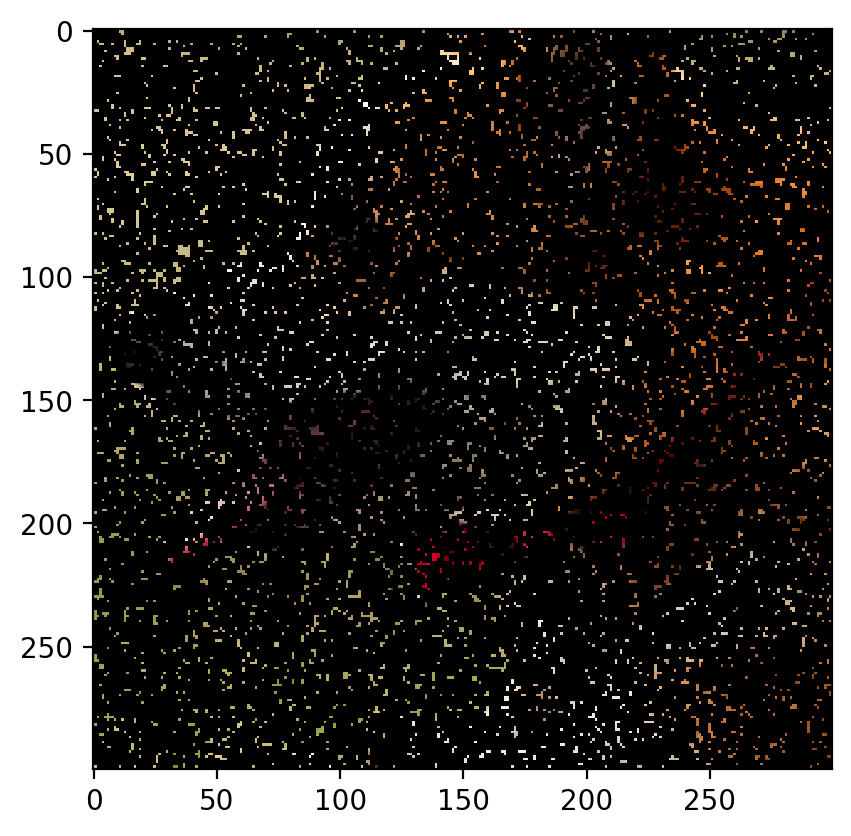

In [12]:
# Mask the image with NaN values

def mask_image_rgb(img, prop): # edited to remove the same points from all 3 channels, r,g and b.
    img_copy = img.clone()
    mask = torch.rand(img[0].shape) < prop
    img_copy[0][mask] = float('nan')
    img_copy[1][mask] = float('nan')
    img_copy[2][mask] = float('nan')
    return img_copy, mask

masked_img = mask_image_rgb(crop, 0.5)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

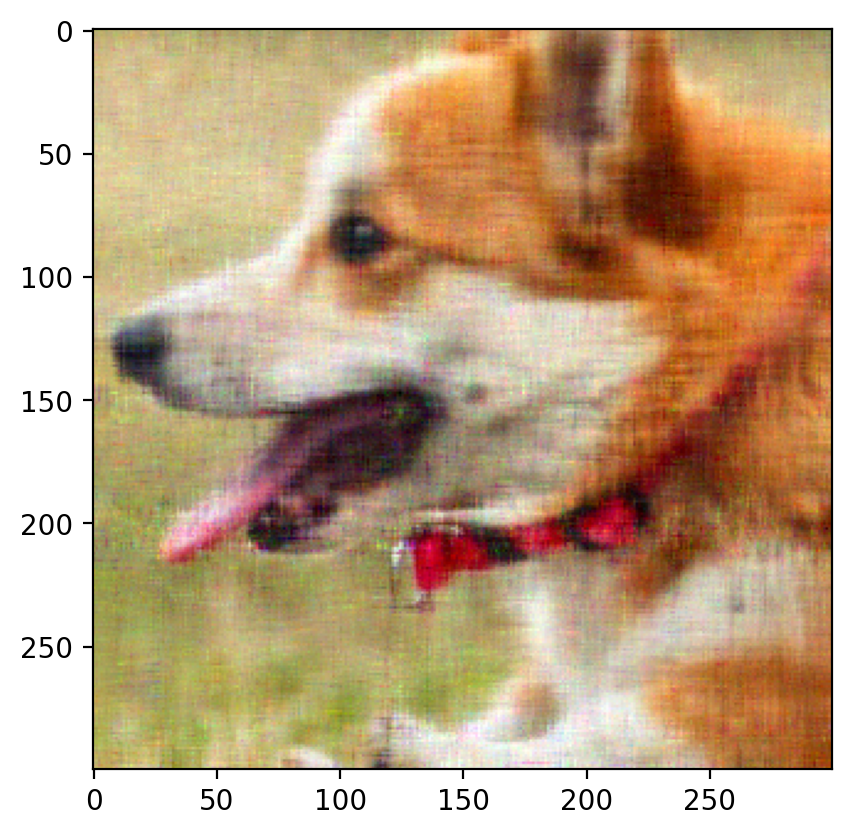

In [13]:
import torch.optim as optim
def factorize(A_list, k, device=torch.device("cpu")):
    # Factorize a list of matrices A_list into lists of matrices W_list and H_list
    W_list = []
    H_list = []
    loss_list = []

    for A in A_list:
        A = A.to(device)

        W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
        H = torch.randn(k, A.shape[1], requires_grad=True, device=device)

        optimizer = optim.Adam([W, H], lr=0.01)
        mask = ~torch.isnan(A)

        for _ in range(1000):

            diff_matrix = torch.mm(W, H) - A # Compute the loss
            diff_vector = diff_matrix[mask]
            loss = torch.norm(diff_vector)

            optimizer.zero_grad() # Zero the gradients

            loss.backward() # Backpropagate

            optimizer.step() # Update the parameters

        W_list.append(W.detach().clone())
        H_list.append(H.detach().clone())
        loss_list.append(loss.detach().clone())

    return torch.stack(W_list), torch.stack(H_list), torch.stack(loss_list)

W, H, loss = factorize(masked_img[0], 50, device=device)

image_np = torch.matmul(W, H).cpu().numpy()

image_np = np.transpose(image_np, (1, 2, 0))

plt.imshow(image_np)
plt.show()

In [14]:
def create_coordinate_map_mask(img, mask):
    """
    img: torch.Tensor of shape (num_channels, height, width)
    mask: torch.Tensor of shape (height, width)

    return: tuple of torch.Tensor of shape (num_selected_coordinates, 2)
            and torch.Tensor of shape (num_selected_coordinates, num_channels)
    """

    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Mask the coordinates based on the provided mask
    mask_flat = rearrange(mask, 'h w -> (h w)')
    mask_flat = mask_flat.to(X.device)
    mask_flat_not = [not mask_flat[i] for i in range(len(mask_flat))]


    selected_coords = X[mask_flat_not]

    # Move X to GPU if available
    selected_coords = selected_coords.to(device)

    # Reshape the image to (num_selected_coordinates, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c')[mask_flat_not].float()

    return selected_coords, Y

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

In [15]:
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device), rff


In [16]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)

net = LinearModel(2, 3)
net.to(device)

LinearModel(
  (linear): Linear(in_features=2, out_features=3, bias=True)
)

In [17]:
scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

In [18]:
X_rff, rff = create_rff_features(scaled_coords, 10000, 0.03)

print(X_rff.shape)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

torch.Size([45013, 10000])


LinearModel(
  (linear): Linear(in_features=10000, out_features=3, bias=True)
)

In [19]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)

        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch%100==0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

In [20]:
train(net, 0.01, X_rff, Y, 250)

Epoch 0 loss: 0.370995
Epoch 100 loss: 0.001810
Epoch 200 loss: 0.001602


0.0015661760699003935

In [21]:
del selected_coords
del masked_img

In [22]:
def create_coordinate_map(img, scale=1):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(0, width,  1/scale).repeat(int(height*scale), 1)
    h_coords = torch.arange(0, height, 1/scale).repeat(int(width*scale), 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

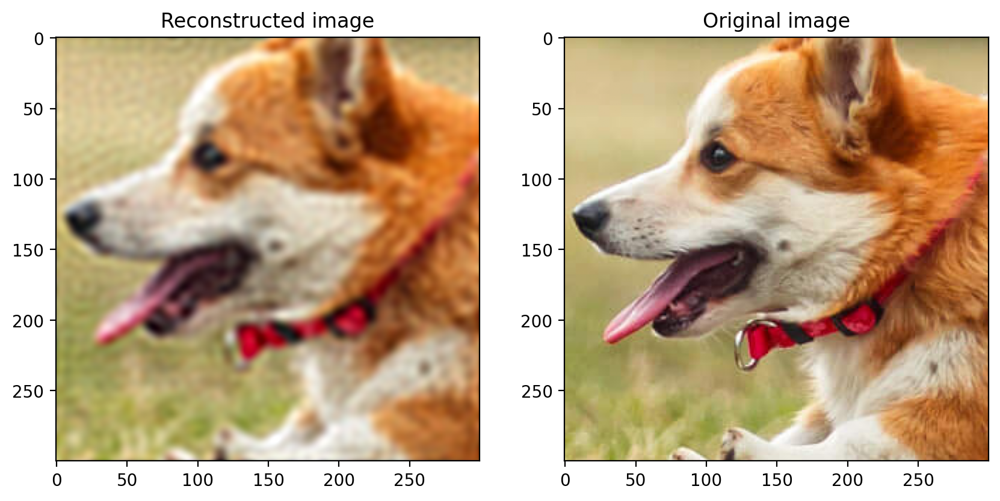

Root Mean Sqaured Error:  tensor(0.0407, device='cuda:0', dtype=torch.float64, grad_fn=<SqrtBackward0>)
PSNR: 27.80407654940028


In [23]:
# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np

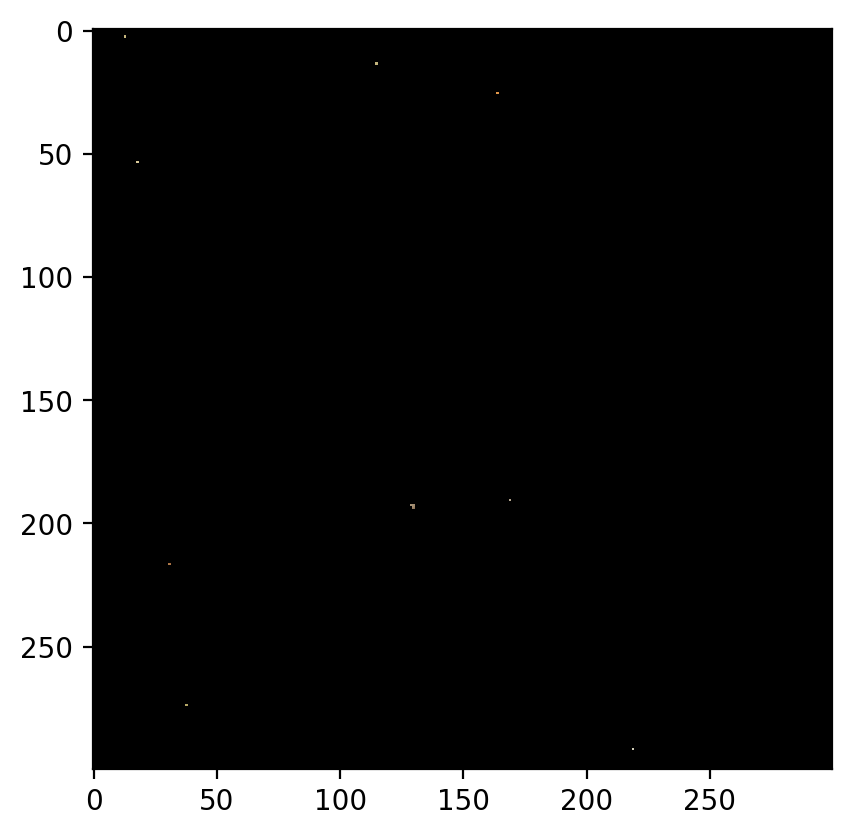

Epoch 0 loss: 0.369176
Epoch 100 loss: 0.002690
Epoch 200 loss: 0.001067
Epoch 300 loss: 0.000905
Epoch 400 loss: 0.000858
Epoch 500 loss: 0.000835
Epoch 600 loss: 0.000821
Epoch 700 loss: 0.000811
Epoch 800 loss: 0.000804
Epoch 900 loss: 0.000799
Epoch 1000 loss: 0.000795
Epoch 1100 loss: 0.000792
Epoch 1200 loss: 0.000789
Epoch 1300 loss: 0.000787
Epoch 1400 loss: 0.000785
Epoch 1500 loss: 0.000784
Epoch 1600 loss: 0.000782
Epoch 1700 loss: 0.000781
Epoch 1800 loss: 0.000780
Epoch 1900 loss: 0.000779
Epoch 2000 loss: 0.000778
Epoch 2100 loss: 0.000777
Epoch 2200 loss: 0.000776
Epoch 2300 loss: 0.000775
Epoch 2400 loss: 0.000774


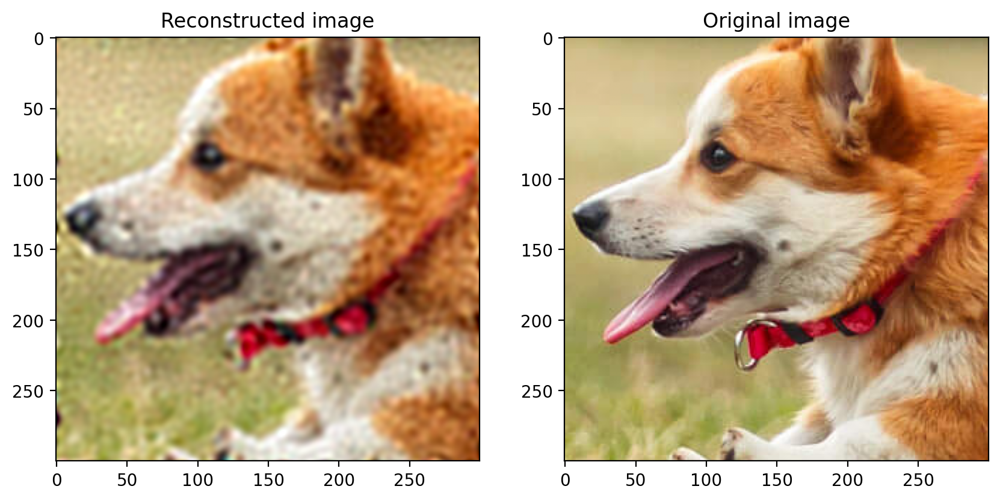

Root Mean Sqaured Error:  tensor(0.0517, device='cuda:0', dtype=torch.float64, grad_fn=<SqrtBackward0>)
PSNR: 25.738279826809702


In [24]:
masked_img = mask_image_rgb(crop, 0.9)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

net = LinearModel(2, 3)
net.to(device)

scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

X_rff, rff = create_rff_features(scaled_coords, 10000, 0.025)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, Y, 2500)

del selected_coords
del masked_img

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np


In [25]:
rmse_arr = []
psnr_arr = []

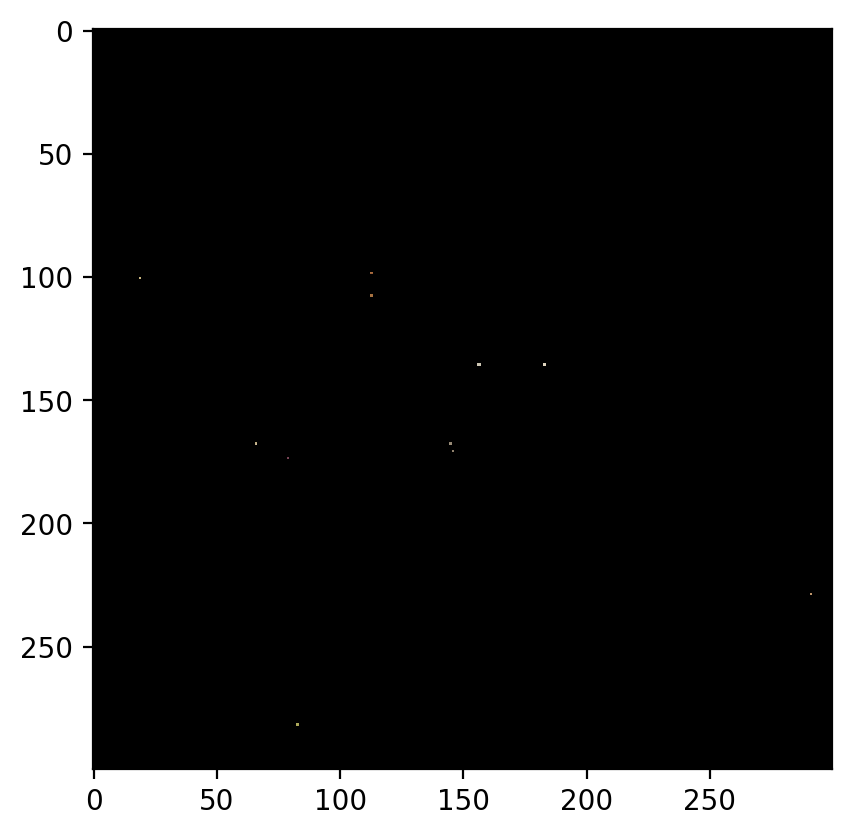

Epoch 0 loss: 0.365725
Epoch 100 loss: 0.005054
Epoch 200 loss: 0.001502
Epoch 300 loss: 0.000791
Epoch 400 loss: 0.000531
Epoch 500 loss: 0.000409
Epoch 600 loss: 0.000342
Epoch 700 loss: 0.000302
Epoch 800 loss: 0.000276
Epoch 900 loss: 0.000260
Epoch 1000 loss: 0.000248
Epoch 1100 loss: 0.000239
Epoch 1200 loss: 0.000232
Epoch 1300 loss: 0.000227
Epoch 1400 loss: 0.000223
Epoch 1500 loss: 0.000220
Epoch 1600 loss: 0.000217
Epoch 1700 loss: 0.000215
Epoch 1800 loss: 0.000213
Epoch 1900 loss: 0.000211
Epoch 2000 loss: 0.000209
Epoch 2100 loss: 0.000208
Epoch 2200 loss: 0.000206
Epoch 2300 loss: 0.000205
Epoch 2400 loss: 0.000204


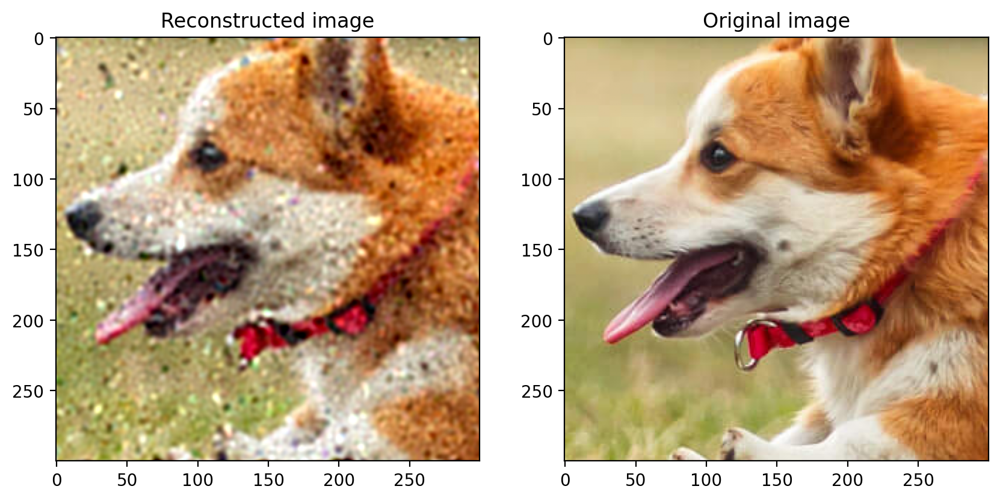

Root Mean Sqaured Error:  tensor(0.0764, device='cuda:0', dtype=torch.float64, grad_fn=<SqrtBackward0>)
PSNR: 22.333845211989697


In [26]:
masked_img = mask_image_rgb(crop, 0.9)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

net = LinearModel(2, 3)
net.to(device)

scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

X_rff, rff = create_rff_features(scaled_coords, 10000, 0.015)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, Y, 2500)

del selected_coords
del masked_img

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np


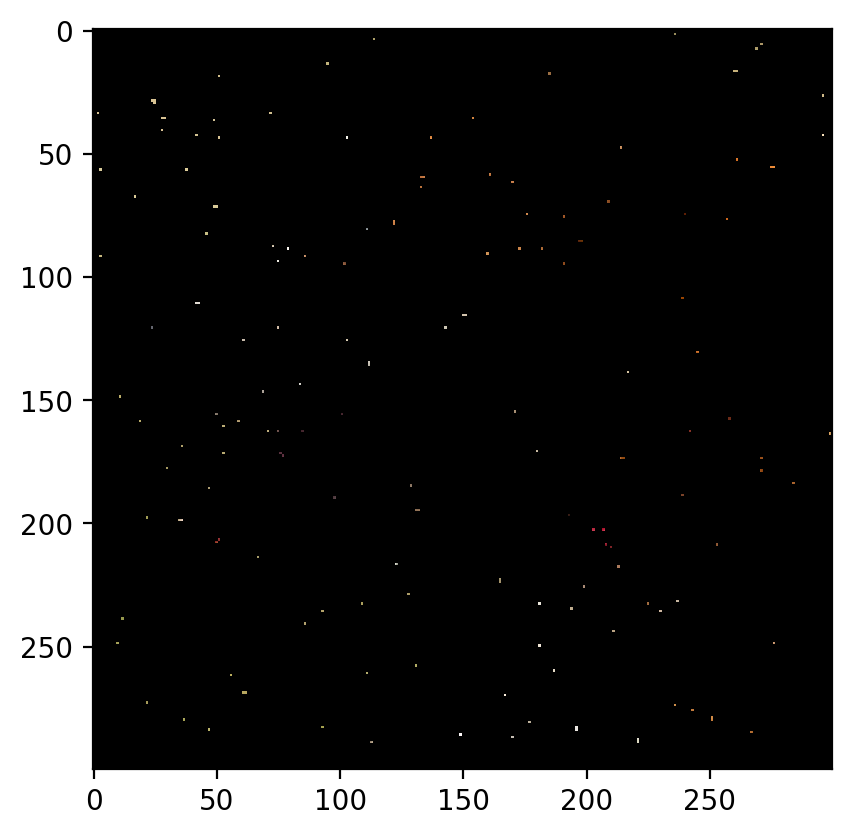

Epoch 0 loss: 0.375460
Epoch 100 loss: 0.006240
Epoch 200 loss: 0.001324
Epoch 300 loss: 0.000746
Epoch 400 loss: 0.000643
Epoch 500 loss: 0.000615
Epoch 600 loss: 0.000603
Epoch 700 loss: 0.000596
Epoch 800 loss: 0.000591
Epoch 900 loss: 0.000587
Epoch 1000 loss: 0.000584
Epoch 1100 loss: 0.000581
Epoch 1200 loss: 0.000579
Epoch 1300 loss: 0.000577
Epoch 1400 loss: 0.000575
Epoch 1500 loss: 0.000574
Epoch 1600 loss: 0.000572
Epoch 1700 loss: 0.000571
Epoch 1800 loss: 0.000570
Epoch 1900 loss: 0.000569
Epoch 2000 loss: 0.000568
Epoch 2100 loss: 0.000567
Epoch 2200 loss: 0.000567
Epoch 2300 loss: 0.000566
Epoch 2400 loss: 0.000565


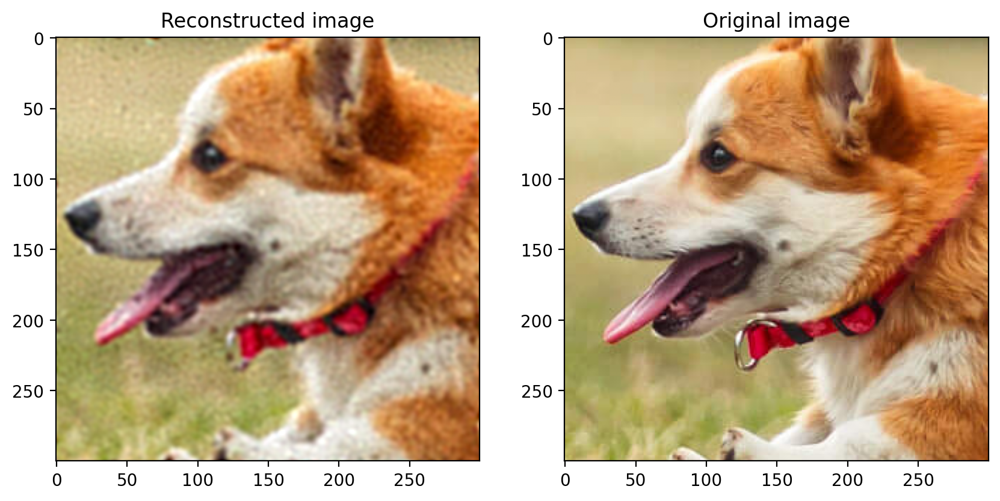

Root Mean Sqaured Error:  tensor(0.0379, device='cuda:0', dtype=torch.float64, grad_fn=<SqrtBackward0>)
PSNR: 28.41724336552472


In [27]:
masked_img = mask_image_rgb(crop, 0.8)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

net = LinearModel(2, 3)
net.to(device)

scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

X_rff, rff = create_rff_features(scaled_coords, 10000, 0.015)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, Y, 2500)

del selected_coords
del masked_img

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np


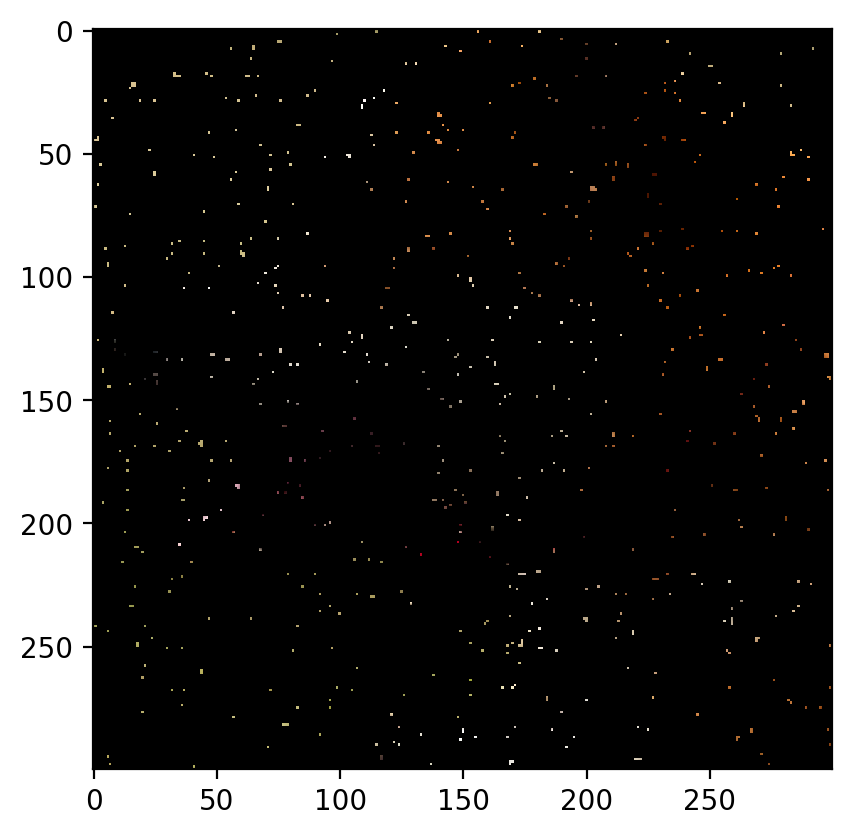

Epoch 0 loss: 0.375289
Epoch 100 loss: 0.007650
Epoch 200 loss: 0.001959
Epoch 300 loss: 0.000992
Epoch 400 loss: 0.000782
Epoch 500 loss: 0.000732
Epoch 600 loss: 0.000716
Epoch 700 loss: 0.000708
Epoch 800 loss: 0.000702
Epoch 900 loss: 0.000698
Epoch 1000 loss: 0.000695
Epoch 1100 loss: 0.000692
Epoch 1200 loss: 0.000690
Epoch 1300 loss: 0.000688
Epoch 1400 loss: 0.000686
Epoch 1500 loss: 0.000685
Epoch 1600 loss: 0.000684
Epoch 1700 loss: 0.000682
Epoch 1800 loss: 0.000681
Epoch 1900 loss: 0.000680
Epoch 2000 loss: 0.000680
Epoch 2100 loss: 0.000679
Epoch 2200 loss: 0.000678
Epoch 2300 loss: 0.000677
Epoch 2400 loss: 0.000677


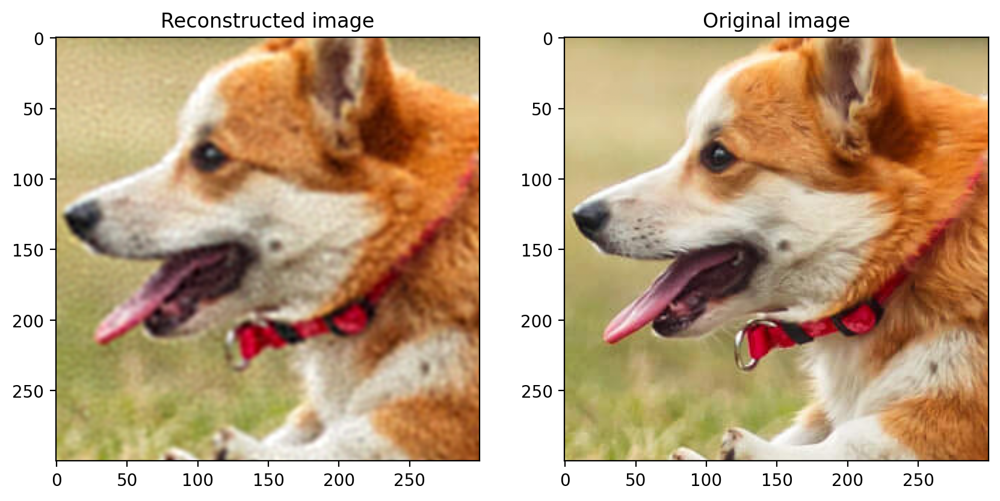

Root Mean Sqaured Error:  tensor(0.0327, device='cuda:0', dtype=torch.float64, grad_fn=<SqrtBackward0>)
PSNR: 29.715897286155702


In [28]:
masked_img = mask_image_rgb(crop, 0.7)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

net = LinearModel(2, 3)
net.to(device)

scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

X_rff, rff = create_rff_features(scaled_coords, 10000, 0.015)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, Y, 2500)

del selected_coords
del masked_img

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np


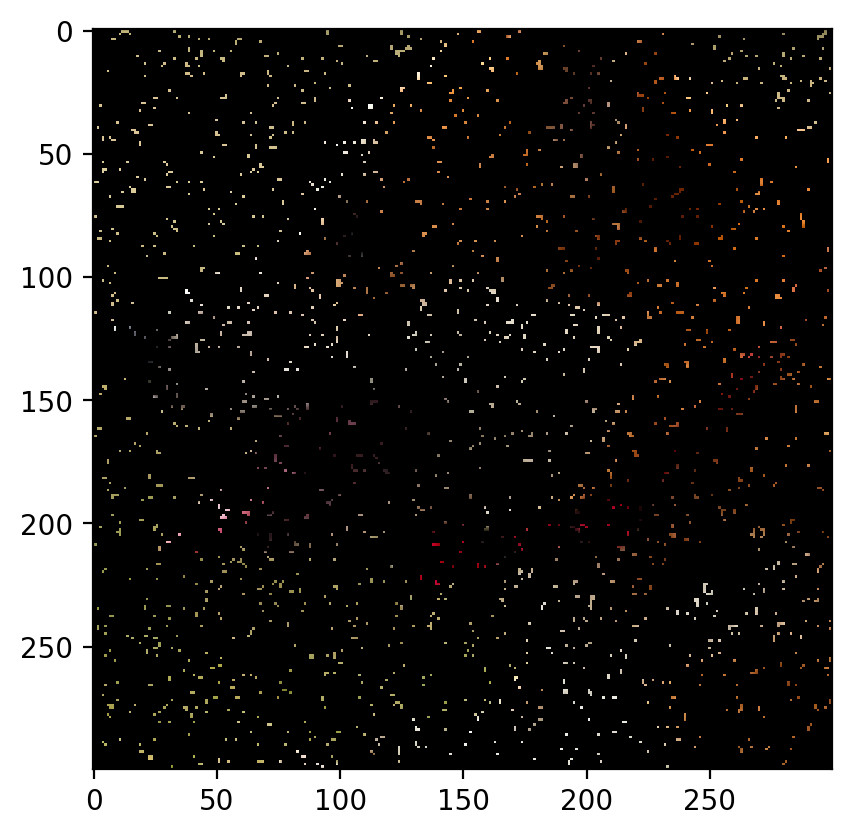

Epoch 0 loss: 0.370707
Epoch 100 loss: 0.006287
Epoch 200 loss: 0.001614
Epoch 300 loss: 0.000924
Epoch 400 loss: 0.000803
Epoch 500 loss: 0.000775
Epoch 600 loss: 0.000764
Epoch 700 loss: 0.000758
Epoch 800 loss: 0.000753
Epoch 900 loss: 0.000749
Epoch 1000 loss: 0.000747
Epoch 1100 loss: 0.000744
Epoch 1200 loss: 0.000743
Epoch 1300 loss: 0.000741
Epoch 1400 loss: 0.000740
Epoch 1500 loss: 0.000738
Epoch 1600 loss: 0.000737
Epoch 1700 loss: 0.000736
Epoch 1800 loss: 0.000735
Epoch 1900 loss: 0.000734
Epoch 2000 loss: 0.000734
Epoch 2100 loss: 0.000733
Epoch 2200 loss: 0.000732
Epoch 2300 loss: 0.000731
Epoch 2400 loss: 0.000731


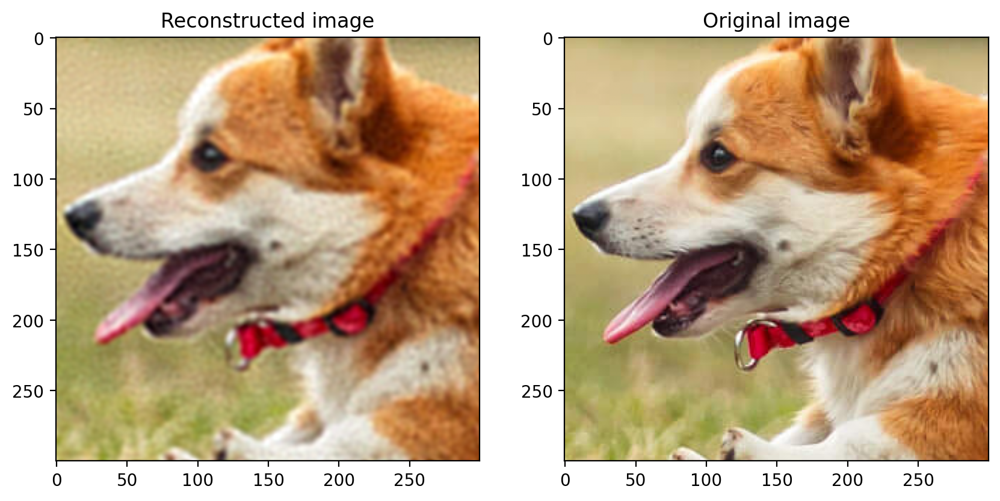

Root Mean Sqaured Error:  tensor(0.0310, device='cuda:0', dtype=torch.float64, grad_fn=<SqrtBackward0>)
PSNR: 30.172051459715604


In [29]:
masked_img = mask_image_rgb(crop, 0.6)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

net = LinearModel(2, 3)
net.to(device)

scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

X_rff, rff = create_rff_features(scaled_coords, 10000, 0.015)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, Y, 2500)

del selected_coords
del masked_img

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np


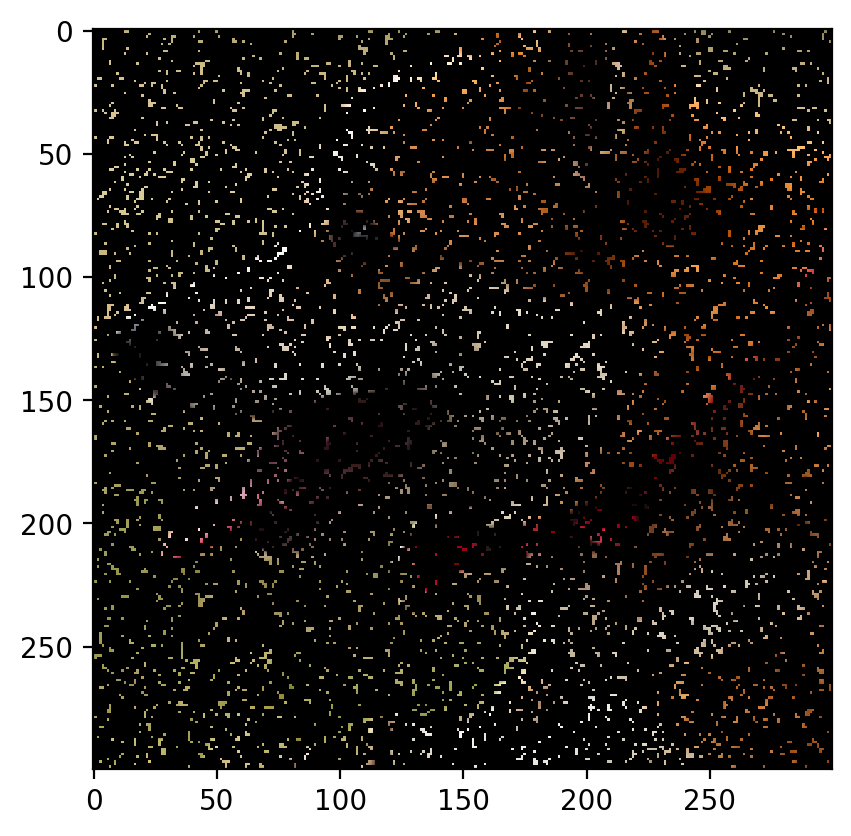

Epoch 0 loss: 0.376038
Epoch 100 loss: 0.006526
Epoch 200 loss: 0.002066
Epoch 300 loss: 0.001151
Epoch 400 loss: 0.000893
Epoch 500 loss: 0.000820
Epoch 600 loss: 0.000799
Epoch 700 loss: 0.000791
Epoch 800 loss: 0.000786
Epoch 900 loss: 0.000782
Epoch 1000 loss: 0.000779
Epoch 1100 loss: 0.000777
Epoch 1200 loss: 0.000775
Epoch 1300 loss: 0.000773
Epoch 1400 loss: 0.000772
Epoch 1500 loss: 0.000770
Epoch 1600 loss: 0.000769
Epoch 1700 loss: 0.000768
Epoch 1800 loss: 0.000767
Epoch 1900 loss: 0.000766
Epoch 2000 loss: 0.000766
Epoch 2100 loss: 0.000765
Epoch 2200 loss: 0.000764
Epoch 2300 loss: 0.000764
Epoch 2400 loss: 0.000763


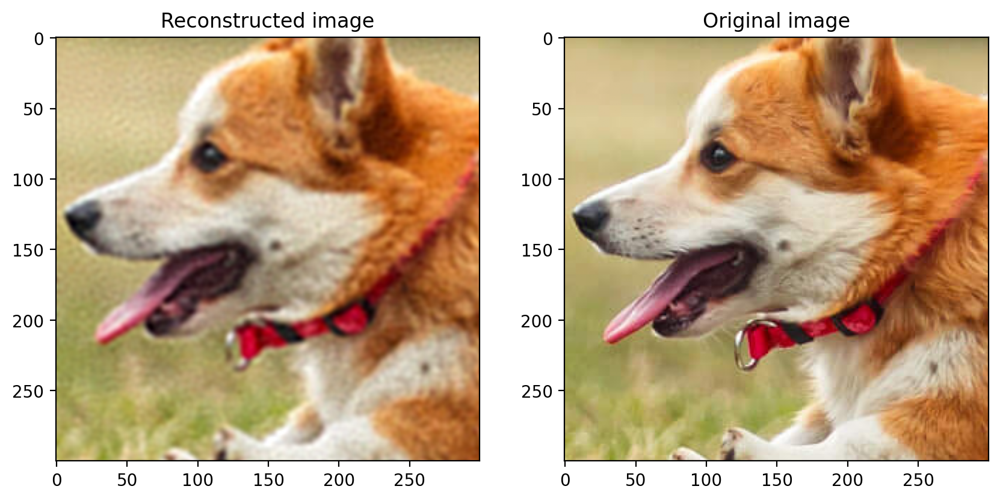

Root Mean Sqaured Error:  tensor(0.0303, device='cuda:0', dtype=torch.float64, grad_fn=<SqrtBackward0>)
PSNR: 30.38277553997866


In [30]:
masked_img = mask_image_rgb(crop, 0.5)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

net = LinearModel(2, 3)
net.to(device)

scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

X_rff, rff = create_rff_features(scaled_coords, 10000, 0.015)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, Y, 2500)

del selected_coords
del masked_img

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np


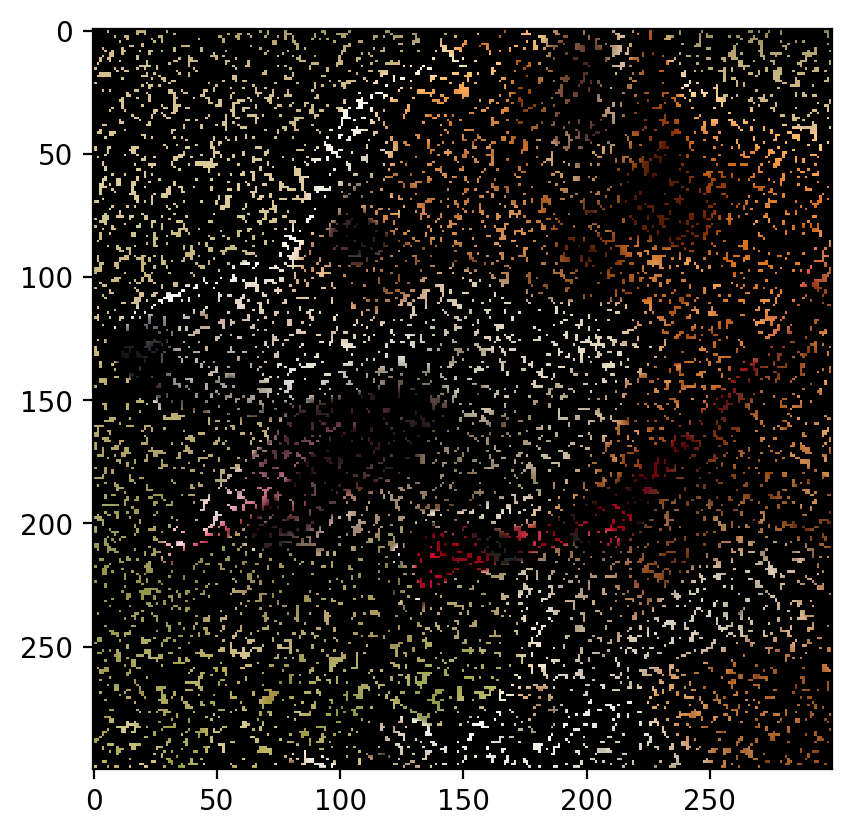

Epoch 0 loss: 0.374222
Epoch 100 loss: 0.005034
Epoch 200 loss: 0.001489
Epoch 300 loss: 0.000958
Epoch 400 loss: 0.000843
Epoch 500 loss: 0.000811
Epoch 600 loss: 0.000799
Epoch 700 loss: 0.000793
Epoch 800 loss: 0.000789
Epoch 900 loss: 0.000785
Epoch 1000 loss: 0.000783
Epoch 1100 loss: 0.000781
Epoch 1200 loss: 0.000779
Epoch 1300 loss: 0.000777
Epoch 1400 loss: 0.000776
Epoch 1500 loss: 0.000775
Epoch 1600 loss: 0.000774
Epoch 1700 loss: 0.000773
Epoch 1800 loss: 0.000772
Epoch 1900 loss: 0.000771
Epoch 2000 loss: 0.000771
Epoch 2100 loss: 0.000770
Epoch 2200 loss: 0.000769
Epoch 2300 loss: 0.000769
Epoch 2400 loss: 0.000768


OutOfMemoryError: CUDA out of memory. Tried to allocate 3.35 GiB. GPU 0 has a total capacity of 14.75 GiB of which 2.77 GiB is free. Process 3164 has 11.98 GiB memory in use. Of the allocated memory 8.80 GiB is allocated by PyTorch, and 3.04 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [31]:
masked_img = mask_image_rgb(crop, 0.4)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

net = LinearModel(2, 3)
net.to(device)

scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

X_rff, rff = create_rff_features(scaled_coords, 10000, 0.015)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, Y, 2500)

del selected_coords
del masked_img

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np


In [ ]:
masked_img = mask_image_rgb(crop, 0.3)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

net = LinearModel(2, 3)
net.to(device)

scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

X_rff, rff = create_rff_features(scaled_coords, 10000, 0.015)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, Y, 2500)

del selected_coords
del masked_img

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np


In [ ]:
masked_img = mask_image_rgb(crop, 0.2)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

net = LinearModel(2, 3)
net.to(device)

scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

X_rff, rff = create_rff_features(scaled_coords, 10000, 0.015)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, Y, 2500)

del selected_coords
del masked_img

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np


In [ ]:
masked_img = mask_image_rgb(crop, 0.1)

image_np = masked_img[0].cpu().numpy()

# Rearrange the dimensions if necessary (assuming it's a color image)
image_np = np.transpose(image_np, (1, 2, 0))

# Display the image using Matplotlib
plt.imshow(image_np)
plt.show()

selected_coords, Y = create_coordinate_map_mask(crop, masked_img[1])

net = LinearModel(2, 3)
net.to(device)

scaler = preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(selected_coords.cpu())
scaled_coords = torch.tensor(scaler.transform(selected_coords.cpu())).float().to(device)

X_rff, rff = create_rff_features(scaled_coords, 10000, 0.015)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, Y, 2500)

del selected_coords
del masked_img

X,Y = create_coordinate_map(crop)
X_scaled = torch.tensor(scaler.transform(X.cpu())).float().to(device)
X_transformed = torch.tensor(rff.transform(X_scaled.cpu().numpy()), dtype=torch.float32).to(device)
X_pred = net(torch.tensor(X_transformed).to(device)).to(device)

# Assuming X_pred is a PyTorch tensor on the GPU
image_np = rearrange(X_pred, '(h w) c -> c h w', h = 300, w = 300)

# Assuming crop is a PyTorch tensor on the GPU or a NumPy array
crop_cpu = crop.cpu().detach().numpy() if isinstance(crop, torch.Tensor) else crop
crop_np = rearrange(crop_cpu, 'c h w -> h w c')

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(rearrange(image_np, 'c h w -> h w c').detach().cpu().numpy())
axs[0].set_title('Reconstructed image')

axs[1].imshow(crop_np)
axs[1].set_title('Original image')

plt.show()

from sklearn.metrics import mean_squared_error
import math

rmse = torch.sqrt(torch.mean((crop - image_np)**2))
print("Root Mean Sqaured Error: ", rmse)

psnr =20 * np.log10(1.0/rmse.cpu().detach().numpy())
print("PSNR:", psnr)

del image_np
del X, Y, net, scaler, X_rff, rff, X_scaled, X_transformed, X_pred,crop_cpu, crop_np


In [ ]:
rmse_arr

In [ ]:
print("RMSE value for different % of image removed during training")
plt.plot(np.array([90,80,70,60,50,40,30,20,10]),[0.0786,0.0387,0.0330,0.0309,0.0301,0.0295,0.0292,0.0289,0.0286])
plt.title("RMSE value for different % of image removed during training")
plt.xlabel("% of data removed")
plt.ylabel("RMSE")

In [ ]:
print("Peak SNR value for different % of image removed during training")
plt.title("Peak SNR value for different % of image removed during training")
plt.plot(np.array([90,80,70,60,50,40,30,20,10]),[22.08719840300042,28.25418146450278,29.63423604352773,30.210612612395682,30.43539642977963,30.596299417410222,30.686033211585062,30.78619621879038,30.86548449905607])
plt.xlabel("% of data removed")
plt.ylabel("Peak SNR")